## Explore embedding morphospace using glass box UMAP and landmarks
---
*Last edited 17 Jun 2026 by K. Wolcott*

In [1]:
# Read in data from latent codes for training attempt
import os, re, json, torch, numpy as np, pandas as pd
from collections import defaultdict
import matplotlib.pyplot as plt
from pathlib import Path

# Specify training directory that contains config.json, latent_codes/, and model/
cwd = Path.cwd()
base_wd = cwd.parent 
train_dir = base_wd / 'run_v57' # TO DO: Update to relevant training attempt directory
os.chdir(train_dir)

# Specify model ckpt to use
CKPT = '3000' # TO DO: Choose the ckpt value you want to analyze results for

# Load config
config_path = 'model_params_config.json'
try:
    with open(config_path, 'r') as f:
        cfg = json.load(f)
    print(f"\033[92mLoaded config from {config_path}\033[0m")
except FileNotFoundError:
    print(f"\033[31mError: model_params_config.json not found in {config_path}. Exiting.\033[0m")

# Get training paths from config
train_paths = cfg['list_mesh_paths']
all_vtk_files = [os.path.basename(f) for f in train_paths]

# Parse species and vertebra info from filenames (e.g. "H-capensis-22-L8.ply_align.vtk").
pat = re.compile(r"^(?P<species>[\w\s\-]+)[\-_ ]+\d+[\-_ ]+(?P<vertebra>[CTL]\d+)", re.IGNORECASE)
labels = []
unmatched_files = []
for f in all_vtk_files:
    fname = os.path.basename(f)
    m = pat.match(fname)
    if m:
        species = m.group("species").strip()
        vertebra = m.group("vertebra").strip()  # e.g. "C2", "L8"
        labels.append((species, vertebra))
    else:
        labels.append((None, None))
        unmatched_files.append(fname)

# Load latent codes from the single .pth file.
CKPT_PATH = 'latent_codes' + '/' + CKPT + '.pth'
latent_ckpt = torch.load(CKPT_PATH, map_location="cpu") 
codes = latent_ckpt['latent_codes']['weight'].detach().cpu().numpy()

Loaded config from model_params_config.json


/tmp/ipykernel_3021836/3649109019.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  latent_ckpt = torch.load(CKPT_PATH, map_location="cpu")


## Statistical analysis of model performance - glass box UMAP
---

In [2]:
# Define functions for plotting
import colorsys
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import json
from numpy.typing import NDArray
!pip install glass-box-umap
from glass_box_umap import GlassBoxUMAP
from glass_box_umap.jacobian import reduce_contributions
from glass_box_umap.plotting import plot_embedding_static, plot_embedding
import plotly.express as px
import plotly.graph_objects as go

# Load landmarks file (.mrk.json)
def load_mrk_json(path):
    with open(path, "r") as f:
        data = json.load(f)
    markups = data.get("markups", [])
    if not markups:
        raise ValueError(f"No 'markups' found in {path}")
    control_points = markups[0].get("controlPoints", [])
    points = []
    labels = []
    for cp in control_points:
        pos = cp.get("position")
        if pos is None:
            continue
        points.append(pos)
        labels.append(cp.get("label"))
    points = np.asarray(points, dtype=np.float32)
    return points, labels

# Get marker based on life history of species
def get_marker(species):
    species = species.lower()
    if "ouroborus" in species:  # bites tail to front
        return 'v' # triangle (down)
    elif any(k in species for k in ["chalcides", "tetradactylus", "chamaesaura", "takydromus"]):  # swims in grass
        return 'P' # plus filled
    elif any(k in species for k in ["skoog", "eremiascincus", "_scincus"]): # swims in sand
        return '+'  # plus regular
    elif any(k in species for k in ["acontias", "mochlus", "rhineura", "dibamus", "lanthanotus", "bipes", "diplometopon", "pseudopus", "bachia", "polychrous"]):  # burrowing
        return 's'  # square
    elif any(k in species for k in ["jonesi", "corucia", "gecko", "chamaeleo", "iguana", "brookesia", "dracaena", "anolis", "basiliscus", 
                                    "dracaena", "aristelliger", "sceloporus", "lialis", "phyllurus", "draco", "hoplodactylus"]):  # arboreal
        return 'd' # thin diamond
    elif any(k in species for k in ["elgaria", "smaug_giganteus", "broadleysaurus", "ateuchosaurus", "alopoglossus", "heloderma", "tupinambis",
                                    "carlia", "lipinia", "tiliqua", "tribolonotus", "leiolepis", "eublepharis", "oreosaurus", "baranus",
                                    "callopistes", "cricosaura", "lepidophyma", "sphenodon", "lacerta", "enyaloides", "crocodilurus"]):  # terrestrial
        return 'X' # x filled
    elif any(k in species for k in ["eryx", "homalopsis", "aniolios"]):   # snake
        return '2' #
    else:                      # saxicolous/rock dwelling
        return 'o'  # circle (default)
    
# Make a reference legend for marker symbols
# Define markers and their corresponding life history strategy labels
legend_items = [
    ('v', 'Bites tail to side'),
    ('P', 'Grass swimmer'),
    ('+', 'Sand swimmer'),
    ('s', 'Burrowers'),
    ('d', 'Arboreal'),
    ('X', 'Terrestrial'),
    ('o', 'Saxicolous'),
    ('2', 'Snake')
]

# Function to plot the legend for life history strategies
def plot_life_history_legend(legend_items, title='Symbol Key for Species Life History Strategies', outfpath=None):
    # Create the figure and axis
    fig, ax = plt.subplots(figsize=(6, 4))
    # Plot dummy points for the legend
    for i, (marker, label) in enumerate(legend_items):
        ax.plot([], [], marker=marker, linestyle='None', markersize=10, label=label, color='black')
    # Customize and display the legend
    ax.legend(loc='center left', frameon=False)
    ax.axis('off')
    plt.title(title)
    plt.tight_layout()
    # Save the plot if an output file path is provided
    if outfpath:
        plt.savefig(outfpath, dpi=300, bbox_inches='tight')
    # Show the plot
    plt.show()

# Function to generate the legend for family colors
def plot_family_color_legend(family_colors):
    # Create a list of patches and labels for the legend
    patches = []
    labels = []
    for family, color in family_colors.items():
        patch = mpatches.Patch(color=color, label=family)
        patches.append(patch)
        labels.append(family)
    # Create the legend
    plt.figure(figsize=(8, 6))
    plt.legend(handles=patches, labels=labels, loc='center left', bbox_to_anchor=(1, 0.5), title="Family Colors")
    plt.axis('off')  # Turn off the axis since we only want the legend
    plt.show()
    
# Define a sort key that orders vertebrae by region (C < T < L) then by the numeric part.
def sort_key(item):
    region_order = {'C': 0, 'T': 1, 'L': 2}
    v = item[0]
    return (region_order.get(v[0], 99), int(v[1:]))

# Get family name for coloring scheme
def extract_family(species_label):
    family = species_label.split('_')[0]
    species_label = species_label.lower()
    
    if any(k in species_label for k in ["scincus", "scincidae"]):
        family = "Scincidae"
    elif "ouroborus" in species_label:
        family = "Cordylidae_Ouroborus"
    elif any(k in species_label for k in ["gerrhosaurus", "gerrho"]):
        family = "Gerrhosauridae"
    elif any(k in species_label for k in ["chamaeleo", "iguana", "agamidae", "anolidae", "corytophanidae", 
                                          "crotaphytidae", "hoplocercidae", "leiocephalidae", "leiosauridae",
                                          "phrynosomatidae", "tropiduridae", "polycrotidae", "chamaeleonidae"]):
        family = "Iguania"
    elif any(k in species_label for k in ["anguidae", "lanthanotus", "varanus", "shinosaurus", "heloderma", "xenosauridae"]):
        family = "Anguimorpha"
    elif any(k in species_label for k in  ["lacertidae", "lacerta", "teiidae", "gymnopthalmidae", "gymothalmidae"]):
        family = "Laterata" 
    elif any(k in species_label for k in  ["bipes", "rhineura", "diplometopon"]):
        family = "Amphisbaenea"
    elif any(k in species_label for k in  ["gecko", "tarentola", "eublepharis", "aristelliger", "phyllurus", "lialis", "gekkota"]):
        family = "Gekkota"    
    elif any(k in species_label for k in ["eryx", "homalopsis", "aniolios"]):
        family = "Snake"
    elif "xantusiidae" in species_label:
        family = "Xantusiidae"
    elif "dibamus" in species_label:
        family = "Dibamidae"
    elif "sphenodon" in species_label:
        family = "Rhynchocephalia"
    
    return family

# Create a colormap for unique families
def make_family_cmap(families):
    default_col =  np.array([0.52, 0.52, 0.52])  # grey
    family_base_colors = {
        "iguania": np.array([0.78, 0.16, 0.16]),  # auburn
        "anguimorpha": np.array([1.00, 0.79, 0.20]),  # saffron
        "cordylidae": np.array([0.10, 0.51, 0.40]),  # dark teal
        "cordylidae_ouroborus": np.array([0.082, 0.76, 0.92]),  # turquoise - blue
        "gekkota": np.array([0.41, 0.227, 0.6]),  # dark lilac
        #"gymnophthalmoidea": np.array([0.73, 0.14, 0.5]),  # dark hot pink
        "gerrhosauridae": np.array([0.98, 0.39, 0.14]),  # orange
        "scincidae": np.array([0.65, 0.69, 0.12]),  # apple green
        "amphisbaenea": np.array([0.60, 0.50, 0.46]),  # warm slate
        "laterata": np.array([0.145, 0.39, 0.075]),  # forest green
        "xantusiidae": np.array([0.88, 0.74, 0.59])  # emoji white
    }
    # Normalize family names to lowercase to handle case-insensitive comparison
    family_colors = {}
    for family in families:
        family_lower = family.lower()  # Convert input family name to lowercase
        family_colors[family] = family_base_colors.get(family_lower, default_col)
    return family_colors

# Add a gradient by species within family
def generate_species_cmap_gradient(family_base_colors, species_groups, max_shift=0.4):
    species_colors = {}
    family_species_map = defaultdict(list)
    # Group species by family
    for species in species_groups:
        family = extract_family(species)
        family_species_map[family].append(species)
    for family, species_list in family_species_map.items():
        base_rgb = family_base_colors.get(family, np.array([0.7, 0.7, 0.7]))  # fallback: gray
        base_hls = colorsys.rgb_to_hls(*base_rgb)
        sorted_species = sorted(species_list)
        n = len(sorted_species)
        center_idx = n // 2
        for i, sp in enumerate(sorted_species):
            if i == center_idx:
                # Middle species gets base color
                new_rgb = base_rgb
            else:
                # Shift lightness slightly (lighter or darker)
                shift_direction = -1 if i < center_idx else 1
                shift_amount = (abs(i - center_idx) / (n - 1)) * max_shift
                new_lightness = np.clip(base_hls[1] + shift_direction * shift_amount, 0, 1)
                new_rgb = colorsys.hls_to_rgb(base_hls[0], new_lightness, base_hls[2])
            species_colors[sp] = tuple(np.clip(new_rgb, 0, 1)) + (1.0,)  # Add alpha channel
    return species_colors

# From a species name, get its life history
def get_life_history(species):
    species = species.lower()

    if "ouroborus" in species:
        return "tail_biting"

    elif any(k in species for k in ["chalcides", "tetradactylus", "chamaesaura", "takydromus"]):
        return "grass_swimmer"

    elif any(k in species for k in ["skoog", "eremiascincus", "_scincus"]):
        return "sand_swimmer"

    elif any(k in species for k in [
        "acontias", "mochlus", "rhineura", "dibamus", "lanthanotus",
        "bipes", "diplometopon", "pseudopus", "bachia", "polychrous"
    ]):
        return "burrower"

    elif any(k in species for k in [
        "jonesi", "corucia", "gecko", "chamaeleo", "iguana",
        "brookesia", "dracaena", "anolis", "basiliscus",
        "aristelliger", "sceloporus", "lialis", "phyllurus",
        "draco", "hoplodactylus"
    ]):
        return "arboreal"

    elif any(k in species for k in [
        "elgaria", "smaug_giganteus", "broadleysaurus", "ateuchosaurus",
        "alopoglossus", "heloderma", "tupinambis", "carlia",
        "lipinia", "tiliqua", "tribolonotus", "leiolepis",
        "eublepharis", "oreosaurus", "baranus", "callopistes",
        "cricosaura", "lepidophyma", "sphenodon", "lacerta",
        "enyaloides", "crocodilurus"
    ]):
        return "terrestrial"

    elif any(k in species for k in ["eryx", "homalopsis", "aniolios"]):
        return "snake"

    else:
        return "saxicolous"

# Plotting high contrast cmap with 9 colors  
high_contrast_9 = [
    '#e6194b',  # Red
    '#3cb44b',  # Green
    '#4363d8',  # Blue
    '#f58231',  # Orange
    '#911eb4',  # Purple
    '#42d4f4',  # Cyan
    '#f032e6',  # Magenta
    '#bfef45',  # Lime
    '#a9a9a9',  # Grey
]
cmap_9 = mcolors.ListedColormap(high_contrast_9)

# From glassboxumap documentation at https://glass-box-umap.readthedocs.io/en/latest/examples/gene_expression.html
# Assign each point to its highest-contributing feature (landmark), keeping only the n_top most common
def groups_from_top_features(contributions: NDArray[np.floating], feature_names: NDArray[np.str_]
                             ,n_top: int = 60,) -> tuple[NDArray[np.integer], list[str], NDArray[np.bool_]]:
    if contributions.ndim == 3:
        contributions = reduce_contributions(contributions)
    top_feature_per_point = feature_names[contributions.argmax(axis=1)]
    unique_features, counts = np.unique(top_feature_per_point, return_counts=True)
    top_features = unique_features[np.argsort(counts)[::-1][:n_top]]
    mask = np.isin(top_feature_per_point, top_features)
    feature_to_id = {name: i for i, name in enumerate(top_features)}
    group_ids = np.array([feature_to_id[f] for f in top_feature_per_point[mask]])
    group_names = list(top_features)
    return group_ids, group_names, mask

### GlassBoxUMAP

/home/k.wolcott/anaconda3/envs/NSM/lib/python3.11/site-packages/torch/cuda/__init__.py:716: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
Seed set to 42
/home/k.wolcott/anaconda3/envs/NSM/lib/python3.11/site-packages/torch/cuda/__init__.py:716: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


Wed Jun 17 15:22:08 2026 Building RP forest with 7 trees
Wed Jun 17 15:22:12 2026 NN descent for 11 iterations
	 1  /  11
	 2  /  11
	 3  /  11
	 4  /  11
	Stopping threshold met -- exiting after 4 iterations


You are using a CUDA device ('NVIDIA RTX 6000 Ada Generation') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]

  | Name    | Type         | Params | Mode  | FLOPs
---------------------------------------------------------
0 | encoder | DeepPReLUNet | 3.3 K  | train | 0    
---------------------------------------------------------
3.3 K     Trainable params
0         Non-trainable params
3.3 K     Total params
0.013     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode
0         Total Flops


View progress with `tensorboard --logdir /tmp/tmp_y8qurz4/logs/`


Training: |          | 0/? [00:00<?, ?it/s]

/home/k.wolcott/anaconda3/envs/NSM/lib/python3.11/site-packages/glass_box_umap/parametric_umap/core.py:247: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_ckpt = torch.l

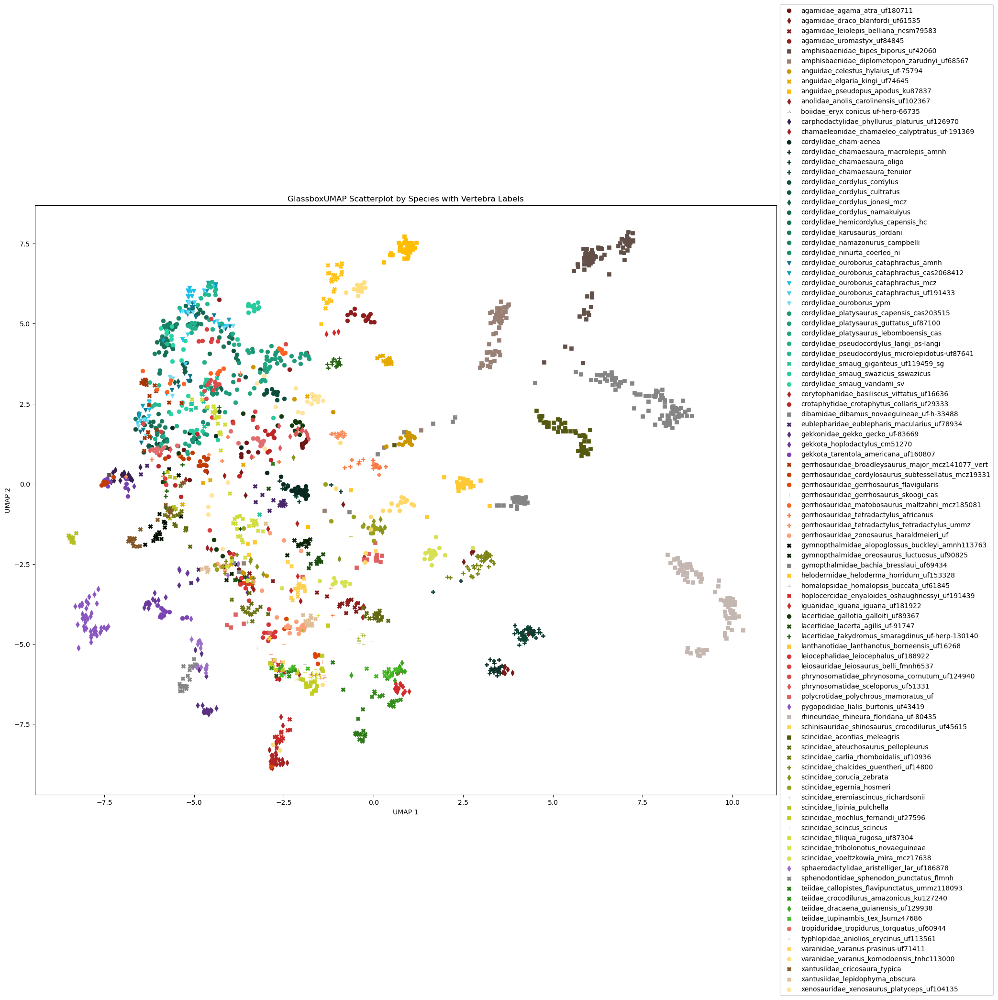

In [3]:
# Run glassboxUMAP to reduce dimensions (using UMAP1 and UMAP2 for the scatterplot).
umap_reducer = GlassBoxUMAP(lr=1e-2, batch_size=10000, 
                            encoder_kwargs={"hidden_size": 64, "n_hidden_layers":1}, pca_components=50, 
                            metric="cosine", random_state=42)
umap_reducer.fit(codes)
umap_coords = umap_reducer.transform(codes)

# Group PC1 and PC2 by species, storing the vertebra label.
species_groups = defaultdict(list)
for i, (species, vertebra) in enumerate(labels):
    if species is not None and vertebra is not None:
        species_groups[species].append((vertebra, umap_coords[i, 0], umap_coords[i, 1]))

# Create a colormap for unique families
families = sorted({extract_family(sp) for sp in species_groups.keys()})
family_base_colors = make_family_cmap(families)

# Add mapping for species colors based on family (gradient of light to dark)
species_colors = generate_species_cmap_gradient(family_base_colors, species_groups)

# Draw Plot
plt.figure(figsize=(20,16))
for species, points in species_groups.items():
    points_sorted = sorted(points, key=sort_key)
    vertebra_labels, pc1_vals, pc2_vals = zip(*points_sorted)
    # Connect points with a dashed line.
    #plt.plot(pc1_vals, pc2_vals, '--', alpha=0.5, color=species_colors[species])
    # Scatter plot the points.
    plt.scatter(pc1_vals, pc2_vals, marker=get_marker(species), color=species_colors[species], label=species, s=40, linewidth=0.5)
    # Annotate each point with its vertebra label.
    #for x, y, label in zip(pc1_vals, pc2_vals, vertebra_labels):
        #plt.annotate(label, (x, y), xytext=(5, 5),  # Offset in points (x, y)
                    #textcoords='offset points', fontsize=8, color=species_colors[species])

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("GlassboxUMAP Scatterplot by Species with Vertebra Labels")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
outfpath = os.path.split(os.getcwd())[1] + '_UMAP_glassbox.png'
plt.savefig(outfpath, dpi=300, bbox_inches='tight')
plt.show()

### Explore exaplanatory variables in UMAP space

#### Latent dimensions

In [4]:
# Inspect latent dimensions driving separation across axes

# Compute contributions
contributions = umap_reducer.compute_contributions(codes)
contrib_horizontal = np.abs(contributions[:, 0, :])  # UMAP axis 0
contrib_vertical = np.abs(contributions[:, 1, :])    # UMAP axis 1

# Average across all vertebrae for each dimension
horizontal_importance = contrib_horizontal.mean(axis=0)
vertical_importance = contrib_vertical.mean(axis=0)

# Top dimensions driving horizontal separation
top_horizontal = horizontal_importance.argsort()[::-1][:10]
# Top dimensions driving vertical separation
top_vertical = vertical_importance.argsort()[::-1][:10]

# Print horizontal
print("\nTop dimensions driving horizontal (UMAP axis 0) separation:")
for i, dim in enumerate(top_horizontal):
    print(f"Rank {i+1}: Latent dim {dim}, importance: {horizontal_importance[dim]:.4f}")

# Print vertical
print("\nTop dimensions driving vertical (UMAP axis 1) separation:")
for i, dim in enumerate(top_vertical):
    print(f"Rank {i+1}: Latent dim {dim}, importance: {vertical_importance[dim]:.4f}")


Top dimensions driving horizontal (UMAP axis 0) separation:
Rank 1: Latent dim 396, importance: 0.0635
Rank 2: Latent dim 441, importance: 0.0616
Rank 3: Latent dim 446, importance: 0.0540
Rank 4: Latent dim 300, importance: 0.0536
Rank 5: Latent dim 187, importance: 0.0535
Rank 6: Latent dim 404, importance: 0.0529
Rank 7: Latent dim 338, importance: 0.0527
Rank 8: Latent dim 487, importance: 0.0522
Rank 9: Latent dim 43, importance: 0.0510
Rank 10: Latent dim 45, importance: 0.0506

Top dimensions driving vertical (UMAP axis 1) separation:
Rank 1: Latent dim 300, importance: 0.0616
Rank 2: Latent dim 187, importance: 0.0584
Rank 3: Latent dim 387, importance: 0.0555
Rank 4: Latent dim 194, importance: 0.0544
Rank 5: Latent dim 14, importance: 0.0537
Rank 6: Latent dim 484, importance: 0.0529
Rank 7: Latent dim 65, importance: 0.0529
Rank 8: Latent dim 217, importance: 0.0526
Rank 9: Latent dim 500, importance: 0.0512
Rank 10: Latent dim 487, importance: 0.0509


#### Landmarks

In [5]:
# Load 3D Slicer Atlas aligned and scaled landmark data

# Load all your landmark files
lm_dir = "/home/k.wolcott/UF Dropbox/Katherine Wolcott/neural_shape_models/haag/atlas/builder/run_v57/2026_02-10_11_42_58/alignedLMs/"
lm_coords = []
for fpath in all_vtk_files:
    lm_name = os.path.splitext(fpath)[0] + ".mrk.json"
    lm_path = lm_dir + "/" + lm_name
    coords, _ = load_mrk_json(lm_path)
    lm_coords.append(coords)

# Reshape into array for N specimens
lm_coords_3d = np.stack(lm_coords)   # (N, 28, 3)
print(f"Landmark data shape - 3d: {lm_coords_3d.shape}")

# Load in mean lm and model from atlas ssm
ssm_dir = "/home/k.wolcott/UF Dropbox/Katherine Wolcott/neural_shape_models/haag/atlas/builder/run_v57/2026_02-10_11_42_58/atlas/"
mean_lms_fn = "atlas_sparse_landmarks.mrk.json"
mean_mesh_fn = "atlas_model.ply"
mean_lms_3d, _ = load_mrk_json((ssm_dir + mean_lms_fn))

# Compute "Lollipop" Displacement Vectors (similar to R geomorph)
lollipop_vectors_3d = lm_coords_3d - mean_lms_3d  # Shape: (N_specimens, 28, 3)

Landmark data shape - 3d: (2285, 28, 3)


In [18]:
# Visualize mean landmarks

# Build data frame
df = pd.DataFrame(mean_lms_3d, columns=["X", "Y", "Z"])
df["Label"] = [str(i + 1) for i in range(len(df))]

# Plot landmarks
fig = px.scatter_3d(df, x="X", y="Y", z="Z", title="3‑D Landmark Plot", labels={"X": "X (m)", "Y": "Y (m)", "Z": "Z (m)"}, width=800, height=600)
fig.update_traces(marker=dict(size=4, color="rgba(217, 83, 25, 0.5)"))

# Add numeric labels
fig.add_trace(go.Scatter3d(x=df["X"], y=df["Y"], z=df["Z"], mode="text", text=df["Label"], textposition="top center",textfont=dict(size=10, color="black"),showlegend=False))
fig.update_layout(scene=dict(xaxis_title="X (m)", yaxis_title="Y (m)", zaxis_title="Z (m)"), margin=dict(l=0, r=0, b=0, t=30))

fig.show()

In [ ]:
# Visualize lollipop displacement vectors for all specimens

# Build line segments for all specimens
x_lines, y_lines, z_lines = [], [], []
for specimen in lollipop_vectors_3d:          # iterate over N specimens
    for origin, delta in zip(mean_lms_3d, specimen):
        tip = origin + delta
        x_lines += [origin[0], tip[0], None]
        y_lines += [origin[1], tip[1], None]
        z_lines += [origin[2], tip[2], None]

# Displacement Sticks (all specimens)
fig = go.Figure()
fig.add_trace(go.Scatter3d(x=x_lines, y=y_lines, z=z_lines, mode="lines", line=dict(color="steelblue", width=1.5), opacity=0.4, name="Displacement", showlegend=True))

# Balls (mean landmarks)
fig.add_trace(go.Scatter3d(x=mean_lms_3d[:, 0], y=mean_lms_3d[:, 1], z=mean_lms_3d[:, 2], mode="markers+text", marker=dict(size=5, color="rgba(217, 83, 25, 0.9)"),
                           text=[str(i + 1) for i in range(len(mean_lms_3d))], textposition="top center", textfont=dict(size=9, color="black"), name="Mean LM", showlegend=True))
fig.update_layout(title="Lollipop Displacement Vectors (All Specimens)", scene=dict(xaxis_title="X (m)", yaxis_title="Y (m)", zaxis_title="Z (m)"),
                  margin=dict(l=0, r=0, b=0, t=40), width=900, height=650)
fig.show()

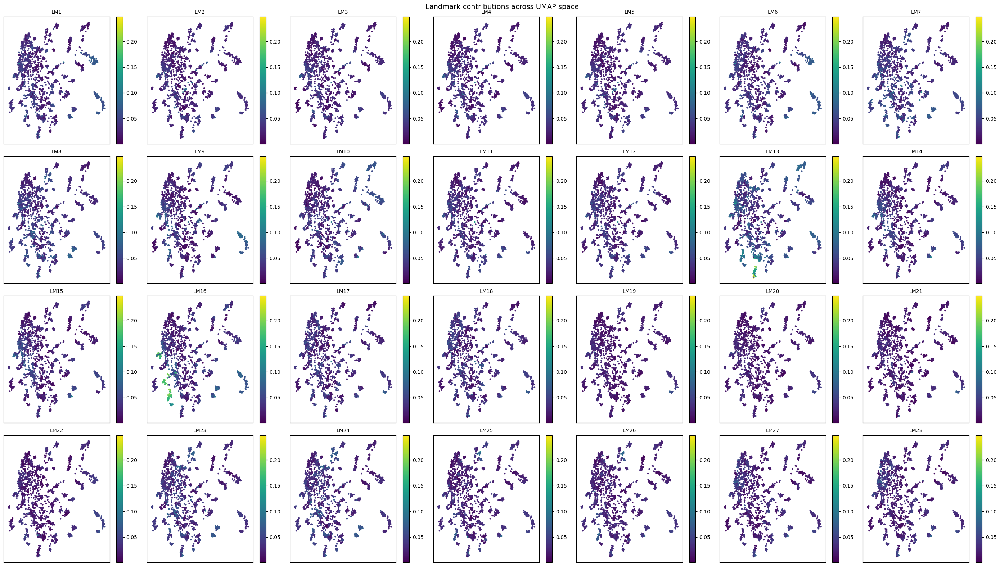

In [ ]:
# Find regions of UMAP with high deviation from mean per landmark

# Group contributions into per-landmark magnitudes
landmark_contributions = np.linalg.norm(lm_coords, axis=2)
landmark_contributions = np.linalg.norm(lollipop_vectors_3d, axis=2)

# Plot UMAP colored by each landmark's contribution
fig, axes = plt.subplots(4, 7, figsize=(28, 16))  # 4 rows × 7 cols = 28 landmarks
axes = axes.flatten()

vmax = landmark_contributions.max() * 0.7

for lm_idx in range(28):
    ax = axes[lm_idx]
    sc = ax.scatter(
        umap_coords[:, 0],
        umap_coords[:, 1],
        c=landmark_contributions[:, lm_idx],
        cmap='viridis',
        s=5,
        vmin=landmark_contributions.min(),
        vmax=vmax  
    )
    ax.set_title(f'LM{lm_idx+1}', fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(sc, ax=ax)

plt.suptitle('Landmark contributions across UMAP space', fontsize=14)
plt.tight_layout()
plt.savefig('landmark_contributions_umap.png', dpi=200, bbox_inches='tight')
plt.show()

#### Evaluate symmetry vs asymmetry

In [7]:
# Way to figure out which lm idx represent X, Y, Z using lm variance

# Find which axis varies least along midline landmarks (should be x axis)
midline_idx = [20, 21, 8, 9, 12, 15]  

# --- Paired landmarks (0-indexed) ---
paired_landmarks = {
    0: 5,
    1: 4,
    2: 3,
    18: 19,
    22: 23,
    24: 25,
    6: 7,
    26: 27,
    13: 14,
    10: 11,
    16: 17
}

mid = lm_coords_3d[:, midline_idx, :]   # (N, M, 3)
mid_flat = mid.reshape(-1, 3)
axis_var = np.var(mid_flat, axis=0)

# 1st check - Find axis of symmetry using landmarks along midline as constant
print("1st Check - Find which idx is the X-axis")
print(f"Midline Landmarks {midline_idx}")
x_idx = np.argmin(axis_var)
print("idx with the lowest var should be X axis (midline): X idx = ", x_idx)
print("0:", axis_var[0])
print("1:", axis_var[1])
print("2:", axis_var[2])

# 2nd check - Find which axis of symmetry varies most among paired landmarks (should be x; same as above)
print("\n2nd Check - Find which idx is the X-axis")
diffs = []
for left, right in paired_landmarks.items():
    L = lm_coords_3d[:, left, :]   # (N, 3)
    R = lm_coords_3d[:, right, :]  # (N, 3)
    d = L - R                      # (N, 3)
    diffs.append(d)
diffs = np.concatenate(diffs, axis=0)  # (N_pairs * N, 3)
axis_asym = np.var(diffs, axis=0)

print(f"Paired left-right landmarks {paired_landmarks}")
print("idx with the highest var should be X axis (landmarks are mirrored across X axis): X idx = ", np.argmax(axis_asym))
print("0:", axis_asym[0])
print("1:", axis_asym[1])
print("2:", axis_asym[2])

# 3rd check - Find which axis varies most among LM 13 - 16 (condyle and neural spine; should be y)
print("\n3rd Check - Find which idx is the Y-axis")
print(f"\nCotyle vs Neural Spine landmarks (13 & 16)")
L = lm_coords_3d[:, 12, :]   
R = lm_coords_3d[:, 15, :]
diff = L - R   
mean_abs = np.mean(np.abs(diff), axis=0)
y_idx = np.argmax(mean_abs)
print("idx with the highest var should be Y axis (LM): Y idx = ", y_idx)
print("0:", mean_abs[0])
print("1:", mean_abs[1])
print("2:", mean_abs[2])

# 4th check - Find which axis varies most among LM 1 - 17 (pre and post zygapophyses; should be z)
print("\n4th Check - Find which idx is the Z-axis")
print(f"\nPre- and post-zygapophyses landmarks (1 & 17)")
L = lm_coords_3d[:, 0, :]   
R = lm_coords_3d[:, 16, :]
diff = L - R   
mean_abs = np.mean(np.abs(diff), axis=0)
z_idx = np.argmax(mean_abs)
print("idx with the highest var should be Z axis (LM): Z idx = ", z_idx)
print("0:", mean_abs[0])
print("1:", mean_abs[1])
print("2:", mean_abs[2])

# Build axis list using determined order
axis_order = [None, None, None]
axis_order[z_idx] = 'z'
axis_order[x_idx] = 'x'
axis_order[y_idx] = 'y'

1st Check - Find which idx is the X-axis
Midline Landmarks [20, 21, 8, 9, 12, 15]
idx with the lowest var should be X axis (midline): X idx =  1
0: 0.020400943
1: 0.00078266836
2: 0.014444297

2nd Check - Find which idx is the X-axis
Paired left-right landmarks {0: 5, 1: 4, 2: 3, 18: 19, 22: 23, 24: 25, 6: 7, 26: 27, 13: 14, 10: 11, 16: 17}
idx with the highest var should be X axis (landmarks are mirrored across X axis): X idx =  1
0: 0.00036275823
1: 0.0068881055
2: 5.902622e-05

3rd Check - Find which idx is the Y-axis

Cotyle vs Neural Spine landmarks (13 & 16)
idx with the highest var should be Y axis (LM): Y idx =  2
0: 0.038566735
1: 0.012018014
2: 0.2835465

4th Check - Find which idx is the Z-axis

Pre- and post-zygapophyses landmarks (1 & 17)
idx with the highest var should be Z axis (LM): Z idx =  0
0: 0.3369921
1: 0.072914116
2: 0.020527944


In [33]:
# Mirror landmarks from right side to left for asymmetry analysis
# See R geomorph bilat.symmetry logic for more info

# Step 1 — Create full mirrored copy of all landmarks
mirrored_lms = lm_coords_3d.copy()
# Reflect all landmarks across x axis
mirrored_lms[:, :, x_idx] *= -1
# Swap paired landmark indices to restore correspondence
for left_idx, right_idx in paired_landmarks.items():
    mirrored_lms[:, [left_idx, right_idx], :] = mirrored_lms[:, [right_idx, left_idx], :]

# Step 2 — Decompose into symmetric and asymmetric components
symm_component = (lm_coords_3d + mirrored_lms) / 2.0   # (N, 28, 3)
asym_component = (lm_coords_3d - mirrored_lms) / 2.0   # (N, 28, 3)

# Step 3 — Test whether asymmetry signal is worth keeping
# Mean asymmetry across specimens (DA)
da_component = asym_component.mean(axis=0, keepdims=True)   # (1, 28, 3)

# Specimen-specific deviation from mean asymmetry (FA)
fa_component = asym_component - da_component                # (N, 28, 3)

# Variance ratios relative to symmetric component
sym_var = np.var(symm_component)
da_var  = np.var(da_component)
fa_var  = np.var(fa_component)

da_ratio = da_var / sym_var
fa_ratio = fa_var / sym_var

print(f"DA ratio: {da_ratio:.4f}")
print(f"FA ratio: {fa_ratio:.4f}")

# Decision threshold — analogous to checking p-values in geomorph ANOVA
THRESHOLD = 0.05  # i.e., asymmetry explains < 5% of individual shape variation

if fa_ratio < THRESHOLD and da_ratio < THRESHOLD:
    print("Asymmetry signal is negligible — proceed with symmetric component only")
    lms_after_sym = symm_component
    # Build keep_indices from confirmed negligible asymmetry result
    left_indices = list(paired_landmarks.keys())
    keep_indices = sorted(set(midline_idx + left_indices))

else:
    print("Asymmetry signal is meaningful — retain both components")
    lms_after_sym = lm_coords_3d  # keep original, analyse separately
    # Keep ALL 28 landmarks — both sides + midline
    keep_indices = list(range(lm_coords_3d.shape[1]))

# Step 4 — Build lollipop vectors from the appropriate component
lollipops_after_sym = lms_after_sym - mean_lms_3d   # (N, 28, 3)
lollipop_features = lollipops_after_sym[:, keep_indices, :].reshape(len(lm_coords_3d), -1)

# Build base names — paired landmarks get combined name, midline stay individual
lm_base_names = [f"LM{i+1}" for i in range(28)]
processed_pairs = set()
for left_idx, right_idx in paired_landmarks.items():
    if left_idx in processed_pairs or right_idx in processed_pairs:
        continue
    combined_name = f"LM{left_idx+1}/{right_idx+1}"
    lm_base_names[left_idx] = combined_name
    processed_pairs.update([left_idx, right_idx])

# Feature names only for kept landmarks
coordinate_names = []
for i in keep_indices:
    for axis in axis_order:
        coordinate_names.append(f"{lm_base_names[i]}_{axis}")

feature_names = np.array(coordinate_names)
print(f"Feature count: {len(feature_names)}")  # should be len(keep_indices) * 3

DA ratio: 0.0295
FA ratio: 0.0022
Asymmetry signal is negligible — proceed with symmetric component only
Feature count: 51


/tmp/ipykernel_3021836/4061175707.py:10: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



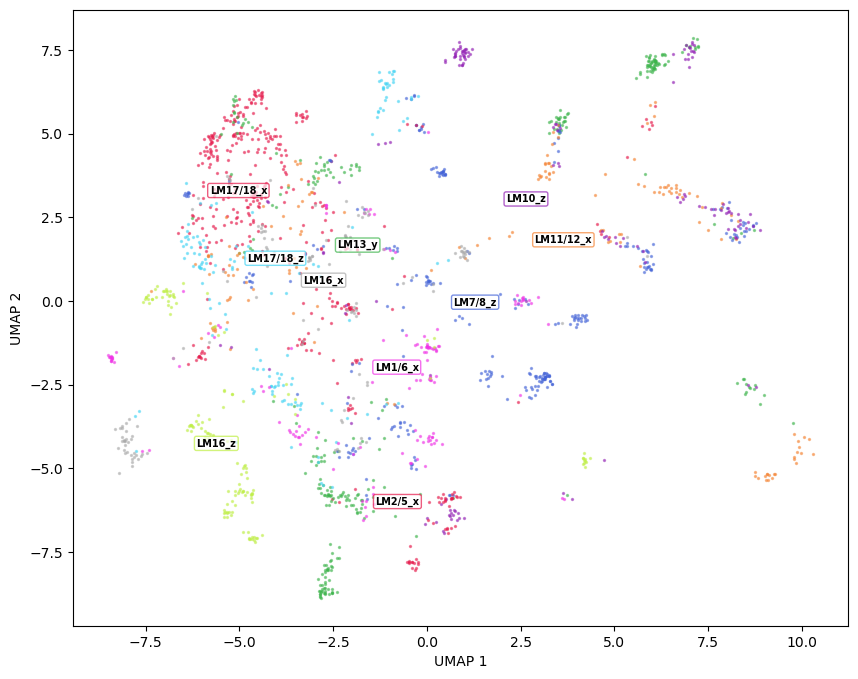

In [60]:
# Use landmark and xyz to color umap points

lm_signal = np.linalg.norm(lollipops_after_sym, axis=2)  # (N, 28)
lm_signal_kept = np.linalg.norm(lollipops_after_sym[:, keep_indices, :], axis=2)  # (N, n_kept)
contributions = np.abs(lollipops_after_sym[:, keep_indices, :]).reshape(len(lm_coords_3d), -1)

group_ids, group_names, mask = groups_from_top_features(contributions=contributions, 
                                                        feature_names=feature_names, n_top=10)

# Plot embedding using the custom map
fig = plot_embedding_static(Z=umap_coords[mask], group_ids=group_ids, group_names=group_names, cmap=cmap_9)
fig.show()

In [ ]:
# Correlate landmark positions with UMAP coordinates (anatomical interpretation)
from scipy.stats import spearmanr

landmark_umap_corr = np.zeros((len(keep_indices), 2))

for i, lm_idx in enumerate(keep_indices):
    lm_magnitude = np.linalg.norm(lollipops_after_sym[:, lm_idx, :], axis=1)
    landmark_umap_corr[i, 0], _ = spearmanr(umap_coords[:, 0], lm_magnitude)
    landmark_umap_corr[i, 1], _ = spearmanr(umap_coords[:, 1], lm_magnitude)

print("Top landmarks correlated with UMAP axis 0:")
for rank_idx in np.abs(landmark_umap_corr[:, 0]).argsort()[::-1][:10]:
    lm_idx = keep_indices[rank_idx]
    print(f"  LM{lm_idx+1}: UMAP0 corr={landmark_umap_corr[rank_idx,0]:.3f}, UMAP1 corr={landmark_umap_corr[rank_idx,1]:.3f}")

print("\nTop landmarks correlated with UMAP axis 1:")
for rank_idx in np.abs(landmark_umap_corr[:, 1]).argsort()[::-1][:10]:
    lm_idx = keep_indices[rank_idx]
    print(f"  LM{lm_idx+1}: UMAP0 corr={landmark_umap_corr[rank_idx,0]:.3f}, UMAP1 corr={landmark_umap_corr[rank_idx,1]:.3f}")

Top landmarks correlated with UMAP axis 0 (horizontal):
  LM14: UMAP0 corr=-0.607, UMAP1 corr=-0.110
  LM10: UMAP0 corr=0.476, UMAP1 corr=0.030
  LM7: UMAP0 corr=0.462, UMAP1 corr=-0.280
  LM17: UMAP0 corr=-0.429, UMAP1 corr=0.357
  LM1: UMAP0 corr=0.419, UMAP1 corr=-0.469
  LM23: UMAP0 corr=0.335, UMAP1 corr=-0.247
  LM27: UMAP0 corr=-0.334, UMAP1 corr=0.088
  LM3: UMAP0 corr=0.308, UMAP1 corr=-0.300
  LM2: UMAP0 corr=0.256, UMAP1 corr=-0.400
  LM25: UMAP0 corr=0.225, UMAP1 corr=-0.332

Top landmarks correlated with UMAP axis 1 (vertical):
  LM1: UMAP0 corr=0.419, UMAP1 corr=-0.469
  LM2: UMAP0 corr=0.256, UMAP1 corr=-0.400
  LM17: UMAP0 corr=-0.429, UMAP1 corr=0.357
  LM25: UMAP0 corr=0.225, UMAP1 corr=-0.332
  LM19: UMAP0 corr=-0.022, UMAP1 corr=-0.329
  LM16: UMAP0 corr=0.044, UMAP1 corr=-0.328
  LM3: UMAP0 corr=0.308, UMAP1 corr=-0.300
  LM7: UMAP0 corr=0.462, UMAP1 corr=-0.280
  LM23: UMAP0 corr=0.335, UMAP1 corr=-0.247
  LM11: UMAP0 corr=-0.173, UMAP1 corr=0.231


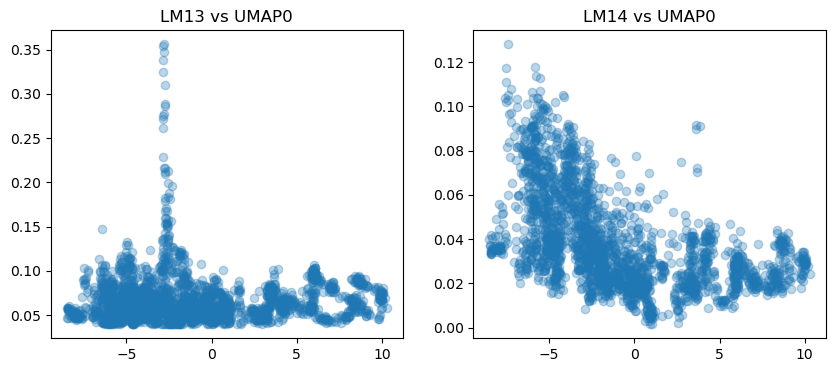

In [ ]:
# inspect LMs across UMAP dims

top_lm_pos = np.abs(landmark_umap_corr[:, 0]).argsort()[::-1][0]
top_lm_idx = keep_indices[top_lm_pos]

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.scatter(umap_coords[:, 0], np.linalg.norm(lollipops_after_sym[:, 12, :], axis=1), alpha=0.3)
plt.title("LM13 vs UMAP0")
plt.subplot(1, 2, 2)
plt.scatter(umap_coords[:, 0], np.linalg.norm(lollipops_after_sym[:, top_lm_idx, :], axis=1), alpha=0.3)
plt.title(f"LM{top_lm_idx+1} vs UMAP0")
plt.show()

In [ ]:
# top PC's by life history

n = umap_coords.shape[0]
from glass_box_umap.jacobian import reduce_contributions

contrib = contributions
if contrib.ndim == 3:
    contrib = reduce_contributions(contrib)
top_pc = contrib.argmax(axis=1)

rows = []

for i in range(n):
    species, vertebra = labels[i]

    if species is None or vertebra is None:
        continue

    rows.append({
        "species": species,
        "vertebra": vertebra,
        "family": extract_family(species),
        "UMAP1": umap_coords[i, 0],
        "UMAP2": umap_coords[i, 1],
        "top_pc": top_pc[i],
    })

df = pd.DataFrame(rows)
df["life_history"] = df["species"].apply(get_life_history)
pd.crosstab(
    df["life_history"],
    df["top_pc"],
    normalize="index"
)

top_pc,0,1,2,3,4,6,9,10,11,12,...,31,36,39,41,42,43,44,46,48,49
life_history,,,,,,,,,,,,,,,,,,,,,
arboreal,0.036630,0.047619,0.003663,0.0000,0.054945,0.000000,0.007326,0.000000,0.014652,0.000000,...,0.021978,0.000000,0.000000,0.000000,0.003663,0.010989,0.003663,0.000000,0.000000,0.000000
burrower,0.046382,0.055659,0.000000,0.0000,0.000000,0.000000,0.163265,0.000000,0.003711,0.051948,...,0.020408,0.001855,0.000000,0.000000,0.005566,0.000000,0.007421,0.000000,0.000000,0.000000
grass_swimmer,0.098039,0.019608,0.000000,0.0000,0.000000,0.004902,0.308824,0.264706,0.009804,0.004902,...,0.049020,0.000000,0.000000,0.000000,0.009804,0.024510,0.009804,0.000000,0.000000,0.000000
sand_swimmer,0.000000,0.190476,0.000000,0.0000,0.000000,0.000000,0.190476,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
saxicolous,0.013255,0.044183,0.000000,0.0000,0.011782,0.000000,0.094256,0.000000,0.014728,0.011782,...,0.306333,0.001473,0.002946,0.000000,0.010309,0.007364,0.005891,0.001473,0.010309,0.001473
snake,0.000000,0.000000,0.333333,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
tail_biting,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.012195,0.000000,0.000000,0.000000,...,0.658537,0.000000,0.000000,0.012195,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
terrestrial,0.013575,0.117647,0.000000,0.0181,0.122172,0.000000,0.108597,0.038462,0.004525,0.002262,...,0.095023,0.000000,0.002262,0.004525,0.006787,0.004525,0.000000,0.000000,0.000000,0.000000


In [ ]:
# Top LMs by family

landmark_magnitudes = np.linalg.norm(lollipops_after_sym[:, keep_indices, :], axis=2)  # (N, n_kept)
landmark_names = np.array([lm_base_names[i] for i in keep_indices])

top_lm_per_vertebra = landmark_names[landmark_magnitudes.argmax(axis=1)]

df['top_landmark'] = top_lm_per_vertebra

# Cross-tabulate by family or life history
pd.crosstab(df['family'], df['top_landmark'], normalize='index')

top_landmark,LM1/6,LM10,LM11/12,LM13,LM14/15,LM16,LM17/18,LM2/5,LM21,LM22,LM23/24,LM25/26,LM27/28,LM3/4,LM7/8,LM9
family,,,,,,,,,,,,,,,,
Amphisbaenea,0.244980,0.008032,0.100402,0.485944,0.000000,0.056225,0.100402,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004016
Anguimorpha,0.275424,0.038136,0.038136,0.072034,0.046610,0.033898,0.254237,0.008475,0.000000,0.000000,0.038136,0.004237,0.000000,0.000000,0.156780,0.033898
Cordylidae_Ouroborus,0.000000,0.000000,0.000000,0.182927,0.000000,0.000000,0.817073,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Dibamidae,0.414894,0.074468,0.244681,0.085106,0.000000,0.053191,0.127660,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Gekkota,0.221519,0.000000,0.000000,0.000000,0.000000,0.683544,0.050633,0.031646,0.000000,0.006329,0.006329,0.000000,0.000000,0.000000,0.000000,0.000000
Gerrhosauridae,0.055556,0.000000,0.061728,0.388889,0.006173,0.123457,0.166667,0.000000,0.000000,0.000000,0.012346,0.000000,0.000000,0.000000,0.185185,0.000000
Iguania,0.125436,0.034843,0.052265,0.313589,0.055749,0.045296,0.226481,0.024390,0.003484,0.000000,0.027875,0.000000,0.003484,0.006969,0.080139,0.000000
Laterata,0.170732,0.018293,0.018293,0.256098,0.097561,0.024390,0.048780,0.231707,0.000000,0.006098,0.042683,0.000000,0.000000,0.000000,0.079268,0.006098
Rhynchocephalia,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
# Top lms by life history

top_lm_per_vertebra = landmark_names[landmark_magnitudes.argmax(axis=1)]

df['top_landmark'] = top_lm_per_vertebra

# Cross-tabulate by family or life history
pd.crosstab(df['life_history'], df['top_landmark'], normalize='index')

top_landmark,LM1/6,LM10,LM11/12,LM13,LM14/15,LM16,LM17/18,LM2/5,LM21,LM22,LM23/24,LM25/26,LM27/28,LM3/4,LM7/8,LM9
life_history,,,,,,,,,,,,,,,,
arboreal,0.205128,0.040293,0.021978,0.168498,0.032967,0.329670,0.106227,0.043956,0.000000,0.000000,0.032967,0.000000,0.000000,0.003663,0.014652,0.000000
burrower,0.270872,0.050093,0.100186,0.324675,0.001855,0.083488,0.113173,0.000000,0.001855,0.000000,0.011132,0.000000,0.001855,0.000000,0.038961,0.001855
grass_swimmer,0.333333,0.009804,0.004902,0.063725,0.024510,0.225490,0.053922,0.000000,0.000000,0.000000,0.029412,0.000000,0.000000,0.004902,0.240196,0.009804
sand_swimmer,0.079365,0.000000,0.000000,0.682540,0.031746,0.031746,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.174603,0.000000
saxicolous,0.081001,0.001473,0.048601,0.209131,0.039764,0.085420,0.416789,0.008837,0.000000,0.000000,0.014728,0.001473,0.014728,0.001473,0.064801,0.011782
snake,0.000000,0.000000,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
tail_biting,0.000000,0.000000,0.000000,0.182927,0.000000,0.000000,0.817073,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
terrestrial,0.153846,0.011312,0.029412,0.167421,0.056561,0.138009,0.190045,0.076923,0.000000,0.004525,0.020362,0.000000,0.000000,0.000000,0.151584,0.000000
